In [ ]:
%%capture

import sys

# If you're on Colab:
if 'google.colab' in sys.modules:
    DATA_PATH = 'https://raw.githubusercontent.com/LambdaSchool/DS-Unit-2-Kaggle-Challenge/master/data/'
    !pip install category_encoders==2.*
    !pip install pandas-profiling==2.*

# If you're working locally:
else:
    DATA_PATH = '/Users/keila/Documents/Lambda/Units_Git/DS-Unit-2-Kaggle-Challenge/data/'

In [ ]:
from category_encoders import OneHotEncoder, OrdinalEncoder
from pandas_profiling import ProfileReport
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
import graphviz
import matplotlib.pyplot as plt
import pandas as pd

# Decision Trees

- clean data with **outliers and missing values**
- use scikit-learn **pipelines**
- use scikit-learn for **decision trees**
- get and interpret **feature importances** of a tree-based model
- understand why decision trees are useful to model 

# I. Wrangle Data

In [ ]:
# IMPORT DATASET
df = pd.merge(pd.read_csv(DATA_PATH+'waterpumps/train_features.csv'), 
              pd.read_csv(DATA_PATH+'waterpumps/train_labels.csv')).set_index('id')

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
8776,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
67743,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
19728,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


In [ ]:
def wrangle(fm_path, tv_path = None):
  if tv_path:
    df = pd.merge(pd.read_csv(fm_path, na_values=[0, -2.000000e-08]), 
                pd.read_csv(tv_path)).set_index('id')
  else: 
    df = pd.read_csv(fm_path, na_values=[0, -2.000000e-08]).set_index('id')

  # Drop constant and repeated columns
  df.drop(columns = ['recorded_by', 'extraction_type_group', 'quantity_group'], inplace = True) 

  # Drop columns with high % of NaN values
  df.dropna(axis = 1, thresh = len(df)* 0.8, inplace = True)

  return df

In [ ]:
df = wrangle(fm_path = DATA_PATH+'waterpumps/train_features.csv', 
             tv_path = DATA_PATH+'waterpumps/train_labels.csv')

X_test = wrangle(fm_path = DATA_PATH + 'waterpumps/test_features.csv')

In [ ]:
df.head().T.duplicated()

amount_tsh               False
date_recorded            False
funder                   False
gps_height               False
installer                False
longitude                False
latitude                 False
wpt_name                 False
num_private              False
basin                    False
subvillage               False
region                   False
region_code              False
district_code            False
lga                      False
ward                     False
population               False
public_meeting           False
recorded_by              False
scheme_management        False
scheme_name              False
permit                   False
construction_year        False
extraction_type          False
extraction_type_group     True
extraction_type_class     True
management               False
management_group         False
payment                  False
payment_type             False
water_quality            False
quality_group            False
quantity

In [ ]:
print(df.shape)
X_test.shape

(59399, 31)


(14358, 30)

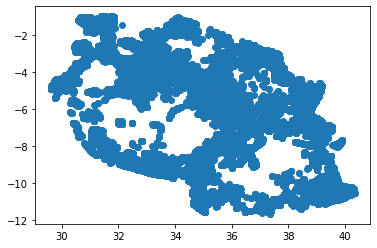

In [ ]:
plt.scatter(df['longitude'], df['latitude'])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 59399 entries, 69572.0 to 26348.0
Data columns (total 36 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             17761 non-null  float64
 1   date_recorded          59399 non-null  object 
 2   funder                 54987 non-null  object 
 3   gps_height             38962 non-null  float64
 4   installer              54967 non-null  object 
 5   longitude              57587 non-null  float64
 6   latitude               57587 non-null  float64
 7   wpt_name               59399 non-null  object 
 8   basin                  59399 non-null  object 
 9   subvillage             59028 non-null  object 
 10  region                 59399 non-null  object 
 11  region_code            59399 non-null  int64  
 12  district_code          59376 non-null  float64
 13  lga                    59399 non-null  object 
 14  ward                   59399 non-null  objec

In [ ]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/54 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# II. Split Data

## Split TV from FM

In [ ]:
target = 'status_group'
y = df[target]
X = df.drop(columns=target)

## Training-Validation Split

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# III. Establish Baseline

- Is this a *regression* or a *classification* problem?
- Because it's a **classification** problem, we need to calculate baseline accuracy based on our majority class. 

In [ ]:
y_train.value_counts(normalize=True)

functional                 0.542583
non functional             0.384352
functional needs repair    0.073066
Name: status_group, dtype: float64

In [ ]:
print('Baseline Accuracy:', y_train.value_counts(normalize=True).max())

Baseline Accuracy: 0.5425829668132747


# IV. Build Model(s)

**First Model:** Logistic Regression

In [ ]:
model_lr = make_pipeline(
    OneHotEncoder(use_cat_names=True),
    SimpleImputer(),
    StandardScaler(),
    LogisticRegression()
)

model_lr.fit(X_train, y_train);

**Second Model:** Decision Tree Classifier

In [ ]:
model_dt = make_pipeline(
    OrdinalEncoder(),
    SimpleImputer(),
    DecisionTreeClassifier()
)

model_dt.fit(X_train, y_train);

# V. Check Metrics

In [ ]:
print('Logistic Regresion training accuracy:', model_lr.score(X_train, y_train))
print('Logistic Regresion validation accuracy:', model_lr.score(X_val, y_val))

In [ ]:
print('Decision Tree training accuracy:', model_dt.score(X_train, y_train))
print('Decision Tree validation accuracy:', model_dt.score(X_val, y_val))

Decision Tree training accuracy: 0.9999789557861066
Decision Tree validation accuracy: 0.696969696969697


# Interlude: How does a tree model work?

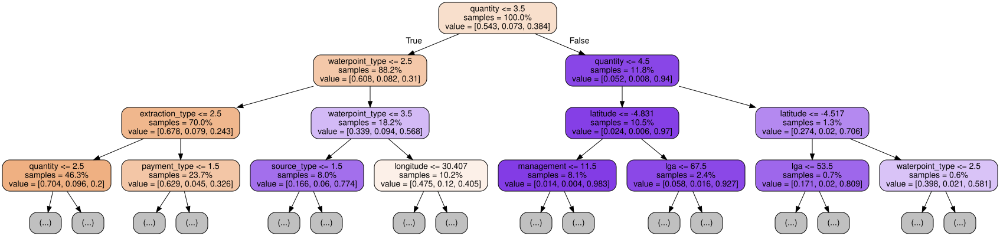

In [ ]:
dot_data = export_graphviz(model_dt.named_steps['decisiontreeclassifier'], 
                           out_file=None, 
                           max_depth=3, 
                           feature_names=X_train.columns,
                           impurity=False, 
                           filled=True, 
                           proportion=True, 
                           rounded=True)   

display(graphviz.Source(dot_data))

# VI. Communicate Results

Feature importance

# Interlude: What is overfitting?

- Let's look at the hyperparameter `max_depth`

In [ ]:
depths = range(2, 32, 2)

train_acc = []
val_acc = []

for depth in depths:
  tree_model = make_pipeline(
      OrdinalEncoder(), 
      SimpleImputer(), 
      DecisionTreeClassifier(max_depth = depth, random_state = 42)
)

  tree_model.fit(X_train, y_train)

  train_acc.append(tree_model.score(X_train, y_train))
  val_acc.append(tree_model.score(X_val, y_val))

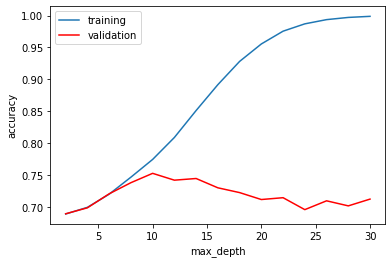

In [ ]:
plt.plot(depths, train_acc, label = 'training')
plt.plot(depths, val_acc, color = 'r', label = 'validation')

plt.xlabel('max_depth')
plt.ylabel('accuracy')
plt.legend();